# Исследование рынка общественного питания в Москве

## Описание проекта

Проведенный анализ предназначен для инвесторов из фонда **«N» (NDA)**, основная задача которого заключается в определении тенденций и особенностей рынка общественного питания г. Москвы в целях инвестирования фонда в открытие заведения. 

**Цель исследования** - определить основные тенденции рынка общественного питания в Москве по состоянию на лето 2022 года, а также провести детальный анализ категории заведений кофеен. Результатом работы является проведенный анализ и разработанные на его основе рекомендации.

**Структура проекта представлена следующими разделами:**

- **Описание проекта,** в рамках которого вкратце раскрываются основные цели проводимого анализа, а также определяются источники данных;
- **Общая информация по дата-сету -** рассматриваются объем анализируемых данных, типы, характеристики столбцов, а также возможные ошибки в данных;
- **Предобработка данных -** в данном разделе подробно раскрывается процесс предобработки данных и резюмируется итог проведенных изменений;
- **Исследовательский анализ данных -** в рамках данного раздела анализируются основные тенденции в дата-сете, а также проектируются визуализации для формирования выводов;
- **Презентация и выводы -** полученные выводы включаются в итоговую презентацию для инвесторов, а также формируется общий вывод по проведенному исследованию.

**Ход исследования**:
Сначала я подключу основные библиотеки, получу данные из файла `'/datasets/moscow_places.csv'` и проведу первичный анализ данных. Далее проведу предобработку: посмотрю на пропуски в данных и заполню их по мере возможности, поменяю типы данных при необходимости, а также поработаю над дубликатами. После этого перейду к непосредственному анализу заведений: сначала проанализирую заведения по разным параметрам (категории, количество мест, расположение, ценовая категория, рейтинг и так далее), а потом проведу анализ категории кофеен по таким же параметрам. В результате будут сформулированы выводы и предложены рекомендации.

**Данные исследования** были получены из сервисов Яндекс Карты и Яндекс Бизнес и являются актуальными на лето 2022 года.

## Общая информация по датасету

### Импорт необходимых библиотек и подключение датасета для проведения анализа

In [1]:
# импорт библиотек
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import folium
import json

# импортируем компоненты библиотеки folium
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster

In [2]:
# настроим цветовую палитру для библиотеки seaborn для однородности стиля в отчете
colors = ['#ADC4CE', '#96B6C5', '#A1CCD1', '#9BABB8','#91C8E4', '#91C8E4', '#749BC2', '#4682A9', '#4F709C', '#213555',
         '#EADBC8', '#DAC0A3', '#A8A196', '#7D7463', '#DFA878', '#BA704F', '#6C3428']
sns.set_palette(sns.color_palette(colors))

In [3]:
# подключаем датасет
df = pd.read_csv('/datasets/moscow_places.csv')

### Анализ основной информации о дата-сете

In [4]:
# выведем общую информацию о дата-сете
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Дата-сет представлен 8406 заведениями, при этом имеются пропуски в столбцах `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup` и `seats`. Для определения корректности типов данных выведем первые 5 строчек дата-сета.

In [5]:
# выводим первые 5 строчек дата-сета
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Вопросы вызывают столбцы `hours`, `avg_bill` (в плане удобства работы) и `seats`, стратегию работы с каждым столбцом будем определять в рамках этапа предобработки данных.

**Промежуточный вывод:** анализируемый дата-сет включает в себя 8406 заведений, имеются пропуски, а также возможные проблемы с типами данных, поэтому необходим этап предобработки. 

## Предобработка данных

### Анализ дубликатов

Прежде всего, целесообразно проверить дата-сет на наличие явных дубликатов и избавиться от них: так мы избавимся от необходимости в дополнительном заполнении пропусков и прочих этапах предобработки данных.

In [6]:
# вызовем соответствующий метод для проверки наличия явных дубликатов
df.duplicated().sum()

0

Видим, что явных дубликатов в дата-сете нет, при этом, вероятно, что неявных дубликатов также быть не должно, так как данные берутся с сервиса. Тем не менее, на всякий случай уберем пробелы, приведем все названия к одинаковому регистру и заменим латинскую "c" на русскую во избежание возможных неявных дубликатов. Опять же, то, что в дата-сете в рамках данного столбца будут дубликаты - нормально, так как некоторые заведения являются сетевыми, поэтому если после проведения преобразований сумма дубликатов изменится в большую сторону - были успешно обработаны неявные дубликаты.

In [7]:
# рассчитаем количество дубликатов названий заведений до обработки
df['name'].duplicated().sum()

2792

In [8]:
# проведем обработку названий заведений: уберем пробелы, заменим буквы, а также приведем все названия к нижнему регистру
df['name'] = df['name'].str.replace(' ', '').str.replace('c', 'с').str.replace('C', 'С').str.replace('-', '')\
             .str.replace('—', '').str.lower()

# рассчитаем количество дубликатов после обработки
df['name'].duplicated().sum()

2937

Количество дубликатов увеличилось на 4% - в целом, это не сильно большой показатель, однако данные теперь являются более обработанными. Также проверим наличие неявных дубликатов по наименованиям заведениц и адресам.

In [9]:
# рассчитаем количество дубликатов по двум столбцам
((df.duplicated(subset=['name', 'address']).sum()) / len(df) * 100)

0.04758505829169641

Видим, что всего в датасете присутствуют около трех заведений, которые с большей вероятностью являются неявными дубликатами в силу идентичного названия и адреса. Так как количество данных заведений составляет менее 1%, то избавимся от этих заведений.

In [10]:
# избавляемся от неявных дубликатов
df = df.drop_duplicates(subset=['name', 'address'])

Наконец, проверим наличие неявных дубликатов в колонках с административными округами и категориями заведений.

In [11]:
# вызовем соответствующий метод для определения уникальных значений в столбце с округами
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [12]:
# вызовем соответствующий метод для определения уникальных значений в столбце с категориями
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Видим, что в данных столбцах отсутствуют неявные дубликаты, поэтому предобработка здесь не понадобится. Прочие столбцы в предобработке на наличие неявных дубликатов не нуждаются: часть из них не будет активно использоваться в рамках проводимого анализа (например, `address` - все-таки округ более показателен, а другие - не представляют категориальные значения или же будут обработаны позже (например, `hours` - в рамках создания дополнительного столбца на определение того, работает ли заведение круглосуточно).

### Анализ пропусков

В рамках первичного анализа данных установили, что пропуски присутствуют в столбцах `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup` и `seats`. Начнем работу с пропусками со столбца `hours`: так как отсутсвует не сильно большое количество данных, то заполнить их можно значением `неизвестно`. Также есть вариант воспользоваться открытыми источниками и заполнить по категориям (например, найти усредненное время работы булочной), однако здесь может возникнуть большая погрешность: все-таки многие заведения самостоятельно определяют время работы вне зависимости от разных факторов.

In [13]:
# заполним пропуски при помощи соответствующего метода
df['hours'] = df['hours'].fillna('неизвестно')

Далее обработаем ценовые столбцы: в дата-сете видна следующая закономерность, что, в целом, если отсутствуют значения ценовой категории, то отсутствуют и значения среднего чека. Можно поступить следующим образом:
- **заполнить пропуски медианным значением при помощи двух категориальных переременных -** категории заведения и его ценовой категории: например, кафе с низким/средним/высоким чеком и так далее. Проблема в том, что категории заведений в дата-сете представлены, а вот ценовые - нет, поэтому этот вариант невозможен, но подошел бы хорошо, так как позволял бы учесть заведения разных категорий в разных ценовых диапазонах;
- **заполнить пропуски медианным значением при помощи категории заведения -** например, медианный средний чек по кафе, ресторанам и так далее. В этом случае мы избавимся от всех пропусков и даже сможем восстановить столбец уровня цен `price`, но при этом повляется достаточно большой риск, что оценки будут смещены (и, возможно, очень сильно), что скажется негативно на вложенных инвестициях (все-таки в данном случае мы анализируем рынок);
- **также заполнить пропуски заглушкой или не заполнять вообще -** в этом случае мы задействуем не все данные, но проведем достоверный анализ на тех данных, которые имеются и получим несмещенные оценки. Таким образом, считаю целесообразным придерживаться именно третьего варианта, при этом оставить пропуски не заполнными, чтобы по ним возможно было провести рассчеты в дальнейшем.

Пропуски в столбце `price` заполним также заглушкой: к сожалению, их никак не восстановить, так как значения по среднему чеку также отсутствуют.

In [14]:
# заполним пропуски при помощи соответсвующего метода
df['price'] = df['price'].fillna('неизвестно')

Пропуски в столбцах `avg_bill` и `middle_coffee_cup` заполнять не будем: первый столбец в целом не будет использоваться в рамках проводимого анализа, так как у нас есть аналогичный количественный столбец `middle_avg_bill`, пропуски в котором уже были заполнены, а `middle_coffee_cup` имеет актуальность только для кофейни: при этом в задаче стоит расчет средней стоимости кружки кофе, но заполнять ее медианным значением в данном случае не стоит - потеряем слишком много данных и, возможно, слишком сильно сместим оценки, поэтому лучше работать с тем, что есть, так как вспомогательных данных (например, дополнительных категорий) у нас нет.

### Анализ типов данных

В целом, все столбцы представляют собой корректный тип данных за исключением столбца `seats` - сложно представить себе дробное количество мест, поэтому переведем его в тип `int`. При этом заполнить пропуски в данном столбце можно нулями: вполне вероятно, что сюда попадают заведения, работающие только на вынос/доставку или какие-либо уличные заведения. Заполненные пропуски позволят нам преобразовать тип данных в необходимый. Также переведем столбец `chain` в тип `bool`, так как по большей степени значения в столбце представляют собой логические значения.

In [15]:
# заменим пропуски на нулевые значения
df['seats'] = df['seats'].fillna(0)

# переведем тип данных в int
df['seats'] = df['seats'].astype('int')

# переведем тип данных в bool
df['chain'] = df['chain'].astype('bool')

### Создание вспомогательных столбцов

Для начала создадим столбец `street` с названиями улиц, который будет использоваться при дальнейшем анализе.

In [16]:
# создадим столбец с названием улицы при помощи соответствующих методов работы со строками
df['street'] = df['address'].str.split(', ').str.get(1)

Также создадим столбец `is_24/7` с типом данных `bool` для определения того, работает ли заведение ежедневно и круглосуточно.

In [17]:
# создадим функцию для создания нового столбца
def set_if_24_and_seven(row):
    if 'ежед' in row['hours'] and 'кругл' in row['hours']:
        return True
    else:
        return False

df['is_24/7'] = df.apply(set_if_24_and_seven, axis=1)

# удостоверимся, что все столбцы были созданы корректно
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,неизвестно,NaN,NaN,NaN,False,0,улица Дыбенко,False
1,четырекомнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,False,4,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,False,45,Клязьминская улица,False
3,dormouseсoffeeshop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,неизвестно,Цена чашки капучино:155–185 ₽,NaN,170.0,False,0,улица Маршала Федоренко,False
4,ильмарко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,True,148,Правобережная улица,False


**Промежуточные выводы:** в рамках этапа предобработки данных были обработаны явные и возможные неявные дубликаты как по всему дата-сету, так и в столбцах, где они могли попадаться - `name`, `district` и `category`. Также была проведена работа с пропусками: в частности, было принято решение воспользоваться заглушкой и не использовать медианное значение в силу отсутствия достаточного количества вспомогательных данных во избежание смещения оценок. Был проведен анализ типов данных и обработаны столбцы `seats` и `chain`, а также созданы вспомогательные столбцы `street` и `is_24/7`, которые будут задействованы в рамках проведения исследовательского анализа данных. 

## Исследовательский анализ данных

### Общий исследовательский анализ данных

#### Анализ категорий заведений

Рассмотрим распределение заведений по категориям, для этого воспользуемся библиотекой `seaborn`, а также элементами библиотеки `matplotlib`.

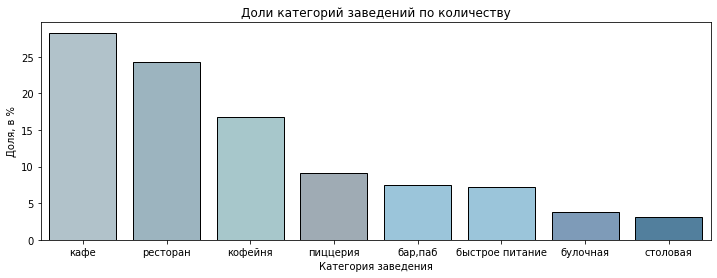

In [18]:
# рассчитаем доли по каждой категории, а также подготовим список уникальных названий категорий для построения графика в дальнейшем
cat_perc = (df['category'].value_counts() / len(df)) * 100
cat_list = df['category'].unique()

# построим график распределения категорий заведений по количеству
plt.figure(figsize=(12, 4))
sns.barplot(x=cat_list, y=cat_perc, edgecolor='#000000')
plt.title('Доли категорий заведений по количеству')
plt.xlabel('Категория заведения')
plt.ylabel('Доля, в %')

plt.show()

На графике видно, что наибольшее количество заведений общественного питания в Москве представляют собой кафе, на втором месте рестораны, а на третьем - кофейни. Меньше всего представлены заведения булочных и столовых. Вполне вероятно, это связано с ростом интереса и привычки потребителей к кофейням, так как там не просто можно купить кофе, но и выпечку, а цены в некоторых кафе, в целом, держатся на уровне столовых.

#### Анализ количества посадочных мест в местах по категориям

Проанализируем количество посадочных в целом: для этого снова воспользуемся библиотекой `seaborn`, однако другим типом графика - гистограммой, так как количество посадочных мест - количественная переменная. Оставим параметр `KDE`, чтобы более явно увидеть формат распределения.

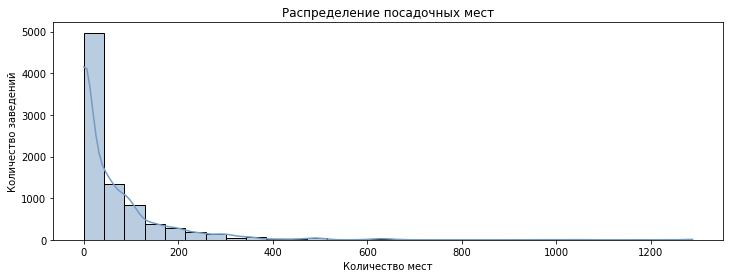

In [19]:
# построим гистограмму распределения посадочных мест
plt.figure(figsize=(12, 4))
sns.histplot(df['seats'], kde=True, color='#749BC2', bins=30)
plt.title('Распределение посадочных мест')
plt.xlabel('Количество мест')
plt.ylabel('Количество заведений')

plt.show()

На гистограмме можно заметить, что большинство заведений обладают 50-150 местами, большим количеством - меньшая часть. При этом на графике отчетливо видны аномальные значения в более чем 1200 мест: пока что удалять их не будем, для начала рассмотрим распределения посадочных мест в зависимости от категории заведения, так как вполне вероятно, что в дата-сете содержатся какие-либо пусть и аномально, но крупные заведения.

**Вопрос к ревьюеру:** можно ли как-то выводить графики из цикла не с новой строки, а пока не заполнится текущая?

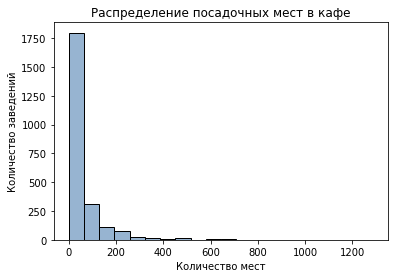

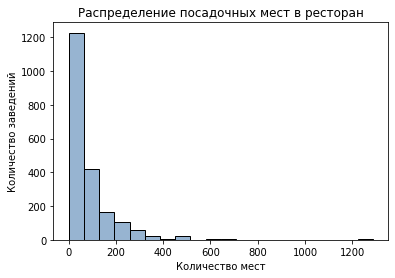

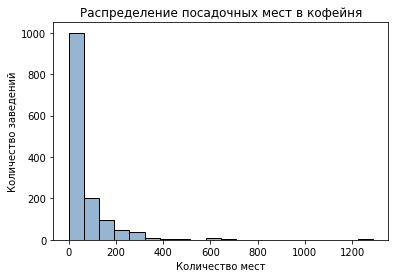

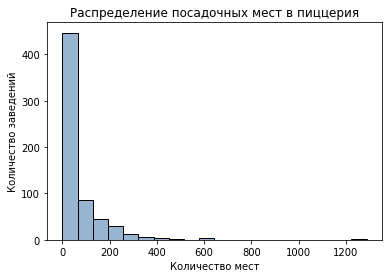

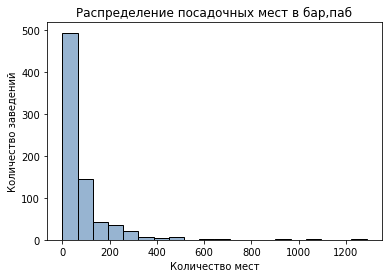

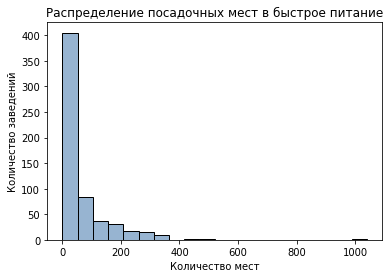

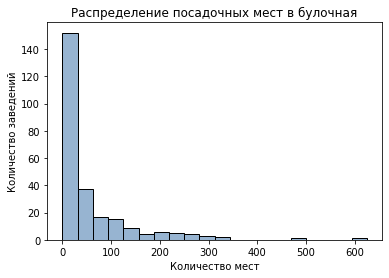

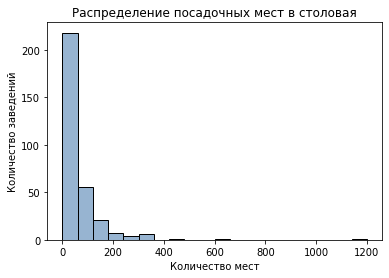

In [20]:
# построим гистограмму распределения посадочных мест по категориям заведений при помощи цикла
for c in df['category'].unique():
    sns.histplot(data=df.loc[df['category'] == c], x='seats', color='#749BC2', bins=20)
    title = c
    plt.title('Распределение посадочных мест в ' + title)
    plt.xlabel('Количество мест')
    plt.ylabel('Количество заведений')
    plt.show()

В целом, распределение по категориям повторяет распределение по местам в целом, однако интересно то, что и аномальные значения здесь встречаются также часто: например, смущает булочная, в которой около 600 мест или кофейня с более чем 1000 местами. При этом была гипотеза, что это банкетный зал, однако вряд ли: при срезе данных `df.query('seats > 1000')` присутствует, например, "Шоколадница" и другие заведения, где вместимость совсем не такая. Вполне вероятно, что это все-таки выброс, а не просто аномальное значение. Рассмотрим более подробно категории и выбросы при помощи графика `boxplot`.

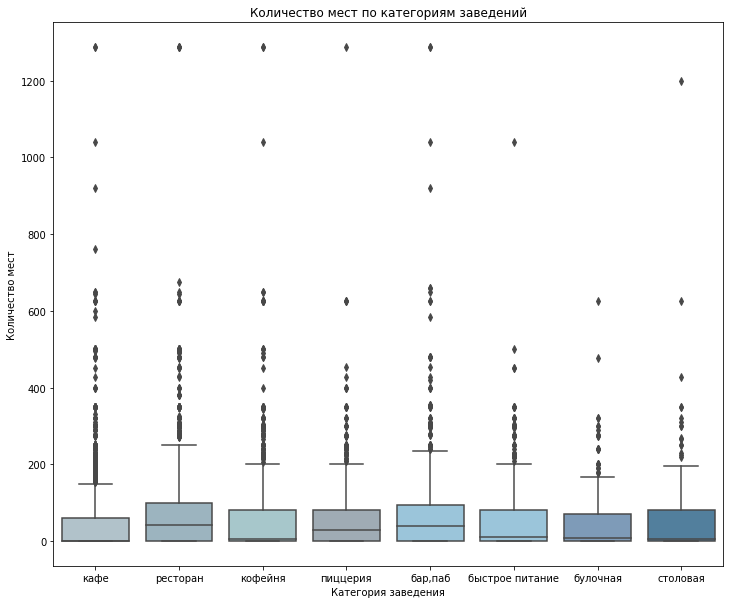

In [21]:
# построим график боксплота
plt.figure(figsize=(12, 10))
sns.boxplot(data=df, x='category', y='seats')
plt.title('Количество мест по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Количество мест')
plt.show()

На графике видно, что выбросы есть, причем их не так уж мало и у каждой категории заведений они свои, при этом установить природу подобных аномалий проблематично: можно было бы предложить, что данные пострадали в процессе изменения типа данных, однако проверка показала обратное, как и то, что это могла бы быть опечатка со стороны пользователя - например, в области десятков, однако мы не можем наверняка утверждать подобное, так как: а) отсутсвуют какие-либо закономерности, указывающие на это (например, нули); б) числа в целом представляются странными, так как повторяются. В силу того, что данный проект является учебным и доступа к заказчику или источнику данных нет, то предлагается гипотеза о том, что данные является выбросами в силу какого-либо технического сбоя или недоработки. За основу возьмем показатель в 250 посадочных мест (на графике выше это минимальное пороговое значения во многих категориях): больше такого количества представить достаточно сложно. Если объем данных с таким количеством посадочный мест меньше 5%, то можно избавиться от них без потери качества проводимого исследования.

In [22]:
# рассчитаем соотношение количества ресторанов с посадочными местами более 250 ко всем
'{:.2f}%'.format((df.query('seats > 250')['name'].count() / 8406) * 100)

'4.75%'

Получаем показатель меньше 5%, поэтому эти данные можно опустить в рамках проводимого исследования.

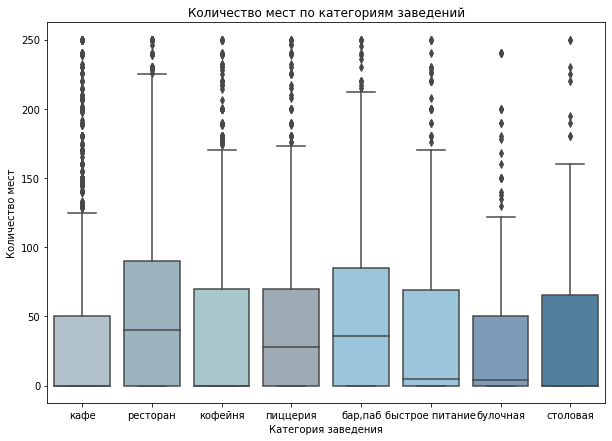

In [23]:
# избавляемся от строк с выбросами
df = df.drop(df.query('seats > 250').index)

# построим график боксплота для того, чтобы удостовериться, что выбросов нет
plt.figure(figsize=(10, 7))
sns.boxplot(data=df, x='category', y='seats')
plt.title('Количество мест по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Количество мест')
plt.show()

Выбросы были успешны удалены: при этом аномальные значения все равно есть, но их значительно меньше, а также они поддаются рациональному объяснениию - например, кафе на 250 мест, в отличие от 1200 и больше, действительно можно представить. 

#### Анализ сетевых и несетевых заведений

Для начала рассмотрим количество сетевых и несетевых заведений в датасете в целом, чтобы определить каких заведений больше.

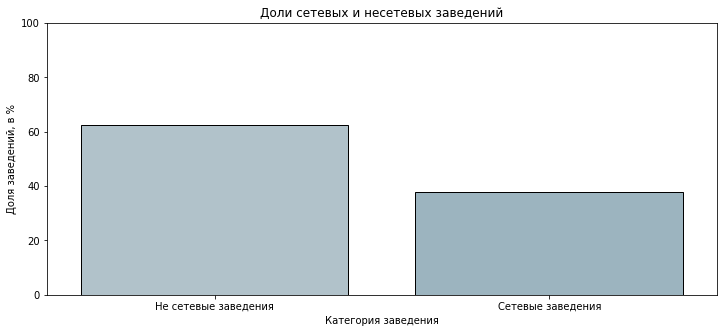

In [24]:
# рассчитаем показатели в процентах
ch_perc = (df['chain'].value_counts() / len(df)) * 100

# так как уникальные значения в столбце представлены всего лишь двумя (True и False), то передадим их в виде списка, чтобы не
# создавать большое количество лишних переменных 
plt.figure(figsize=(12, 5))
sns.barplot(x=['False', 'True'], y=ch_perc, edgecolor='#000000').set_xticklabels(['Не сетевые заведения', 'Сетевые заведения'])
plt.title('Доли сетевых и несетевых заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Доля заведений, в %')
plt.ylim(0, 100)
plt.show()

Интересно, что несетевые заведения превалируют над сетевыми, хотя вторые могли бы опережать по количеству, так как зачастую сети оказываются крупными. Интереснее посмотреть на то, какое соотношение между уникальными названиями сетевых и не сетевых заведений.

In [25]:
# рассчитаем долю уникальных сетевых и не сетевых заведений
ch_perc_unique = (df.query('chain == True')['name'].nunique()) / (df.query('chain == False')['name'].nunique())
ch_perc_unique

0.1604722343681679

Видим, что на 1 не сетевой ресторан приходится 0.16 уникальных сетей, что, в целом, очевидно, особенно в контексте того, что не сетевых заведений, в принципе, оказалось больше. Далее рассмотрим распределение сетевых и не сетевых заведений по категориям.

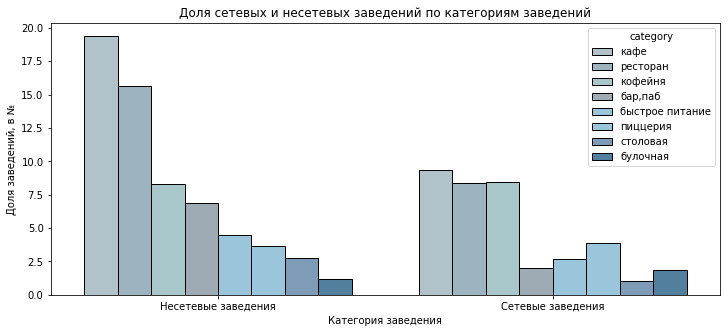

In [26]:
# рассчитаем доли сетевых и не сетевых заведений на каждую категорию, преобразуем полученные данные в отдельный датасет, а также
# избавимся от мультииндекса
ch_perc = (((df.groupby(['category', 'chain'])['chain'].count()) / len(df)) * 100).to_frame()\
          .rename(columns=({'chain': 'value'})).reset_index(level=['category', 'chain']).sort_values\
          (by='value', ascending=False)

# построим график
plt.figure(figsize=(12, 5))
sns.barplot(data=ch_perc, x='chain', y='value', hue='category', edgecolor='#000000').set_xticklabels\
           (['Несетевые заведения', 'Сетевые заведения'])
plt.title('Доля сетевых и несетевых заведений по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Доля заведений, в №')

plt.show()

На графике видно, что среди обеих категорий заведений лидируют быстрое питание, рестораны и кофейни, что уже было видно ранее при анализе долей среди категорий. При этом разница между сетевыми и несетевыми заведениями видна между соотношением баров и булочных: так, у не сетевых заведений доля баров значительно превышает булочные, а у сетей - практически одинаково. Рассмотрим ТОП-15 самых популярных сетевых заведений в Москве, в качестве параметра для определения популярности будем рассматривать количество заведений в рамках сети. Также будем сравнивать заведения не просто по относительным показателем, а внутри своей группы: так мы поймем какую долю каждое из ТОП-15 заведений занимает в рамках ТОП-15.

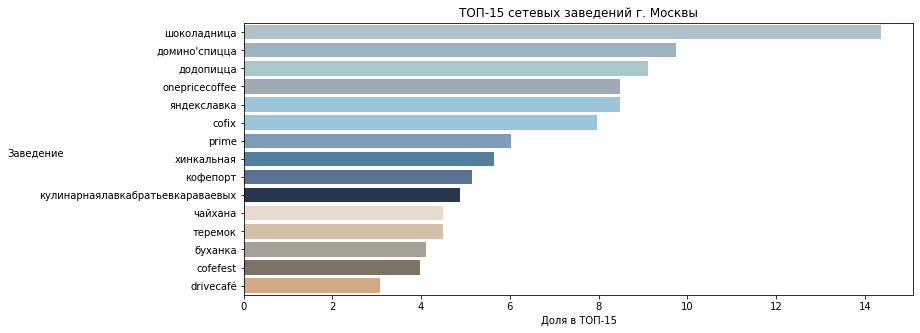

In [27]:
# определим ТОП-15 сетевых заведений, а также рассчитаем доли по отношению к общему количеству сетевых заведений в ТОП-15
top_15 = ((df.query('chain == True').groupby('name')['chain'].count()) / (df.query('chain == True')\
        .groupby('name')['chain'].count().sort_values(ascending=False).head(15).sum()) * 100)\
        .sort_values(ascending=False).reset_index(level='name').head(15)

# для более наглядной визуализаци создадим вертикальный барплот: так будет гораздо лучше видна иерархия заведений в ТОП-15
plt.figure(figsize=(12, 5))
sns.barplot(data=top_15, x='chain', y='name', orient='h')
plt.title('ТОП-15 сетевых заведений г. Москвы')
plt.xlabel('Доля в ТОП-15')
plt.ylabel('Заведение', rotation=360)
plt.show()

На графике можно заметить, что наиболее популярными и многочисленным сетевыми заведениями в Москве являются "Шоколадница", "Домино Пицца", "Додо Пицца", "One Price Coffee", "Яндекс Лавка" и "Cofix", а закрывают рейтинг "Чайхана", "Теремок", "Буханка", "Cofefest" и "Drivecafe". Таким образом, если инвестиционный фонд запланирует открытие сетевого заведения, то приведенные выше заведения являются наиболее крупными игроками рынка. Также рассмотрим к каким категориям относятся данные заведения.

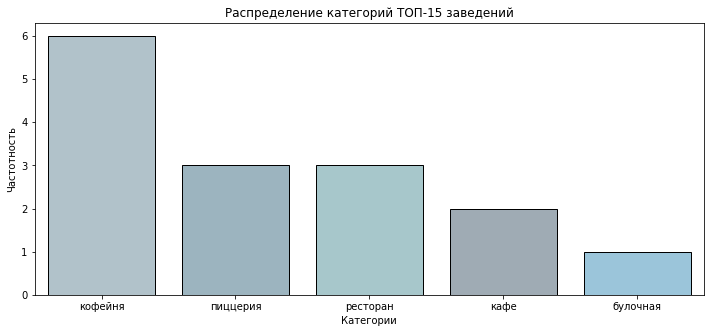

In [28]:
# проведем дополнительную группировку по категориям
top_15_categorized = df.query('chain == True').groupby(['name', 'category'])['chain'].count()\
                    .sort_values(ascending=False).reset_index(level=['name', 'category']).head(15)

# создадим дополнительные переменные с названием уникальных категорий заведений ранжированным количеством категорий заведений
top_15_x = top_15_categorized['category'].unique()
top_15_y = top_15_categorized['category'].value_counts()

# создадим график
plt.figure(figsize=(12, 5))
sns.barplot(x=top_15_x, y=top_15_y, edgecolor='#000000')
plt.title('Распределение категорий ТОП-15 заведений')
plt.xlabel('Категории')
plt.ylabel('Частотность')
plt.show()

Наиболее популярными заведениями среди ТОП-15 являются кофейни, пиццерии и рестораны, при этом кофейни практически вдвое превышают пиццерии и рестораны, а также втрое и более кафе и булочные. При этом наименее частой категорией является булочная. Вполне вероятно, что сетевые заведения в Москве в основном представлены именно кофейнями, так как они представляют собой относительно небольшие помещения, а также могут размещаться в торговых центрах, на фуд-кортах и так далее, что позволяет достигать большого количества по их размещению.

#### Анализ расположения и рейтинга заведений

Проанализируем количество заведений по категориям в каждом округе: при этом данные будем представлять в соотношении количества заведений категории в N-ом административном округе по отношению к общему количеству заведений в рамках данного округа, чтобы понять, какие доли категорий заведений приходятся на конкретный административный округ.

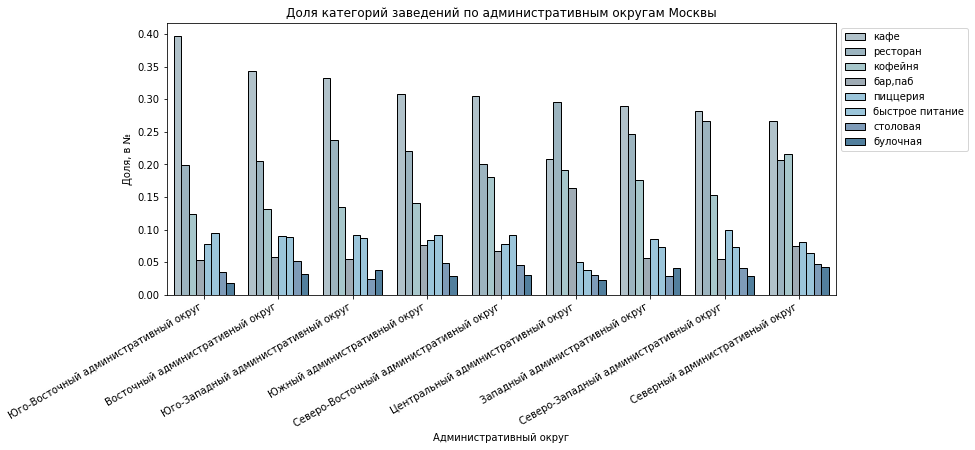

In [29]:
rating_by_cat_and_dist = df.groupby('district')['category'].value_counts(normalize=True).to_frame()\
                         .rename(columns=({'category': 'share'})).reset_index(level=('district', 'category'))\
                         .sort_values(by='share', ascending=False)

plt.figure(figsize=(12, 5))
sns.barplot(data=rating_by_cat_and_dist, x='district', y='share', hue='category', edgecolor='#000000')
plt.title('Доля категорий заведений по административным округам Москвы')
plt.xlabel('Административный округ')
plt.ylabel('Доля, в №')
plt.xticks(rotation=30, ha='right')
plt.legend(bbox_to_anchor=(1, 1))

plt.show()

На графике видно, что распределение между разными округами, в целом, схоже: в во всех округах лидирующими категориями заведений являются кафе, рестораны и кофейни, а булочные, заведения быстрого питания, столовые и бары (за исключением Центрального округа). При этом между округами также видны и различия: например, в Центральном округе одной из лидирующих категорий являются бары, что очевидно, так как это центр города, а в Северном административном округе кофейни превышают численность ресторанов. Тем не менее, общее распределение категорий заведений по округам схоже. Далее проанализируем средний рейтинг заведений по категориям в целом.

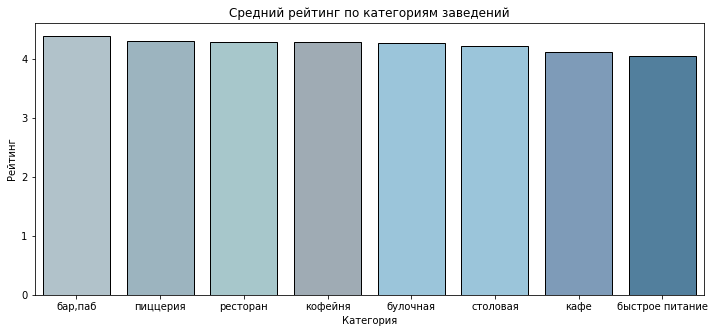

In [30]:
# сгруппируем средний рейтинг по категориям и  заведений
rating_by_cat = df.groupby('category')['rating'].mean().to_frame().reset_index(level='category').sort_values(by='rating', \
                ascending=False)

# построим соответствующую диаграмму
plt.figure(figsize=(12, 5))
sns.barplot(data=rating_by_cat, x='category', y='rating', edgecolor='#000000')
plt.title('Средний рейтинг по категориям заведений')
plt.xlabel('Категория')
plt.ylabel('Рейтинг')

plt.show()

В целом, можно заметить, что средний рейтинг среди категорий заведений находится в одном диапазоне - от 4 до 4.5 баллов. При этом категориями заведений с самым низким средним рейтингом, составляющим 4 балла, являются быстрое питание и кафе, а самыми высокими - бар, кофейня, пиццерия и ресторан. Вполне вероятно, что средний рейтинг заведений нужно посмотреть не только в разрезе категории, но и округа, так как от этого зависит многое. Для этого построим фоновую диаграмму.

In [31]:
# сгруппируем средний рейтинг по каждому из административных округов
rating_by_dist = df.groupby('district', as_index=False)['rating'].mean()

# откроем json-файл и сохраним его в переменную
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    msk_json = json.load(f)

# сохраним долготу и ширину центра Москвы в переменную
moscow_lat, moscow_lng = 55.751244, 37.618423

# создадим карту Москвы и также сохраним ее в переменную
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создадим фоновую диаграмму при помощи конструктура и отобразим ее
Choropleth(
    geo_data=msk_json,
    data=rating_by_dist,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.5,
    legend_name='Средний рейтинг заведений по административным округам Москвы',
).add_to(m)
m

На диаграмме видно, что, в целом, средний рейтинг заведений по округам варьируется от 4.1 до 4.4, то есть в рамках 4 баллов. При этом самым высоким средним рейтингом обладают заведения в Центральном административном округе, что очевидно, так как это центр города и спрос/конкуренция там больше, меньшим - Северных и наименьшим - Южных. Тем не менее, стоит отметить, что разница минимальна и варьируется в пределах 0.3 баллов. Также рассмотрим средний рейтинг заведений одновременно и по категории, и по округам Москвы.

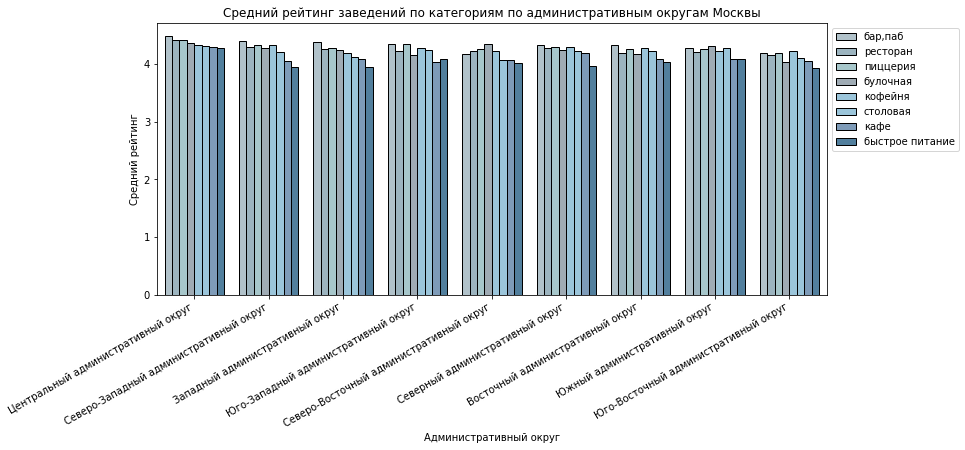

In [32]:
# снова сгруппируем средние значения по рейтингу, но уже не просто по категориям заведений, а еще и по административным округам
rating_by_cat_and_dist = df.groupby(['category', 'district'])['rating'].mean().to_frame()\
                        .reset_index(level=['category', 'district']).sort_values(by='rating', ascending=False)
plt.figure(figsize=(12, 5))
sns.barplot(data=rating_by_cat_and_dist, x='district', y='rating', hue='category', edgecolor='#000000')
plt.title('Средний рейтинг заведений по категориям по административным округам Москвы')
plt.xlabel('Административный округ')
plt.ylabel('Средний рейтинг')
plt.xticks(rotation=30, ha='right')
plt.legend(bbox_to_anchor=(1, 1))

plt.show()

В целом, средний рейтинг по категориям заведений схож и среди административных округов Москвы, однако некоторые тенденции все же заметить можно: например, несмотря на то, что средний рейтинг в основном составляет 4 балла и выше, распределеление средней оценки между категориями заведений в разных округах представляется разным. Так, например, самым однородным с точки зрения среднего рейтинга среди категорий является Центральный округ, что вполне поддается объяснению, так как в центральной части города находятся большинство хороших заведений, наименее однородный рейтинг у прочих округов: при этом, например, в Южных округах наблюдается большая тенденция к высокому среднему рейтингу у кофеен, пиццерий, ресторанов, столовых и баров, а меньшему - заведений быстрого питания и кафе. Стоит отметить, что разница незначительная (буквально 0.5 баллов максимум), однако это интересно учитывать при анализе среднего рейтинга не только по категориям, но и по округам, несмотря на то, что показатели, в целом, однородны. Чтобы окончательно убедиться в корректности выводов, рассчитаем отношение количества заведений с рейтингом менее 4 к общей совокупности.

In [33]:
# рассчитаем долю заведений с рейтингом меньше 4 ко всем заведениям
'{:.2f}%'.format(df.query('rating < 4')['name'].count() / len(df)* 100)

'14.11%'

Доля заведений с рейтингом менее 4 составляет всего лишь 14%, именно поэтому средняя оценка по рейтингу получилась достаточно высокой. Проанализируем эти 14% и определим то, в каких районах и в каких категориях заведений присутсвует такой рейтинг.

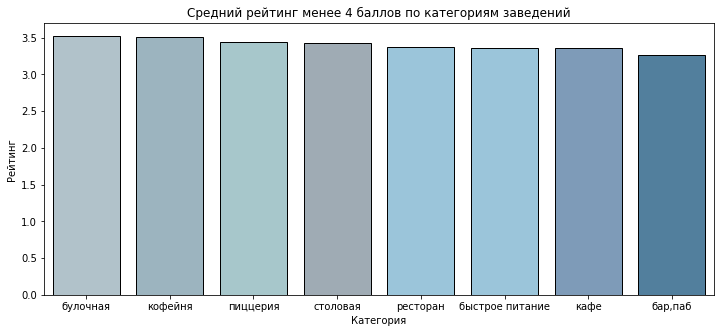

In [34]:
# сгруппируем средний рейтинг по категориям заведений, сделав предварительный срез по рейтингу менее 4 баллов
rating_by_cat_bad_rating = df.query('rating < 4').groupby('category')['rating'].mean().to_frame()\
                           .reset_index(level='category').sort_values(by='rating', ascending=False)

# построим соответствующую диаграмму
plt.figure(figsize=(12, 5))
sns.barplot(data=rating_by_cat_bad_rating, x='category', y='rating', edgecolor='#000000')
plt.title('Средний рейтинг менее 4 баллов по категориям заведений')
plt.xlabel('Категория')
plt.ylabel('Рейтинг')

plt.show()

В целом, рейтинг варьируется минимально и составляет около 3.4-3.5 баллов: самый высокий средний рейтинг в срезе у булочных и кофеен, а низкий - у баров. Также рассмотрим аналогичный срез по административным округам.

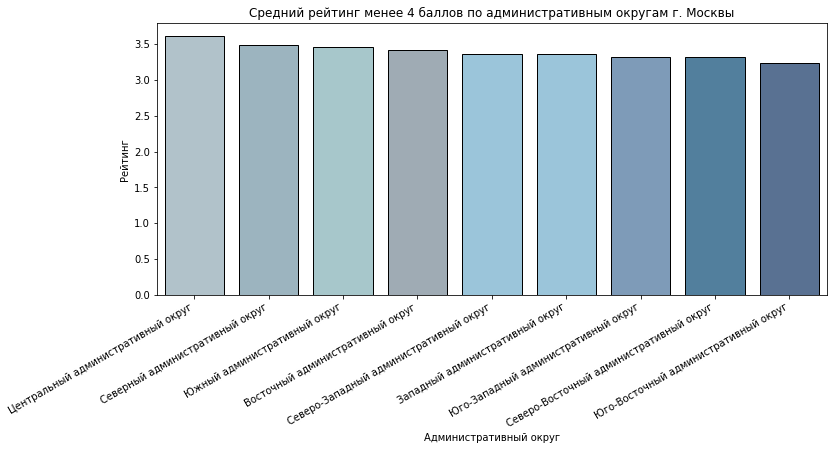

In [35]:
# сгруппируем данные по срезу с рейтингом менее 4 баллов
rating_by_dist_bad_rating = df.query('rating < 4').groupby('district', as_index=False)['rating'].mean().\
                            sort_values(by='rating', ascending = False)

# построим график
plt.figure(figsize=(12, 5))
sns.barplot(data=rating_by_dist_bad_rating, x='district', y='rating', edgecolor='#000000')
plt.title('Средний рейтинг менее 4 баллов по административным округам г. Москвы')
plt.xlabel('Административный округ')
plt.ylabel('Рейтинг')
plt.xticks(rotation=30, ha='right')

plt.show()

Аналогичная картина и здесь: разница между округами не сильная, но есть - наиболее высокий рейтинг по срезу в Центральном административном округе, а низкий - в Юго-Западном, Северо-Восточном и Юго-Восточном округах. В целом, данный анализ не дает дополнительной информации за исключением того, что заведений с рейтингом менее 4 баллов, в целом, значительно меньше во всем датасете, а среди них большая часть заведений обладает рейтингом в 3.5 и более баллов. Наконец, отобразим все заведения на карте Москвы в виде кластеров, чтобы получить полноценную картину.

In [36]:
# перезапишем переменную с картой Москвы, чтобы не наслаивать кластеры на фоновую диаграмму
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создадим кластер
marker_cluster = MarkerCluster().add_to(m)

# создадим функцию для создания кластеров по всему датасету и отобразим карту
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['category']} {row['rating']}",
    ).add_to(marker_cluster)

df.apply(create_clusters, axis=1)
m

Рассмотрим географическое положение заведений более подробно. Во-первых, составим ТОП-15 мест по количеству заведений для опредения наиболее популярных локаций в Москве, а также рассмотрим на распределение категорий заведений в каждом из мест.

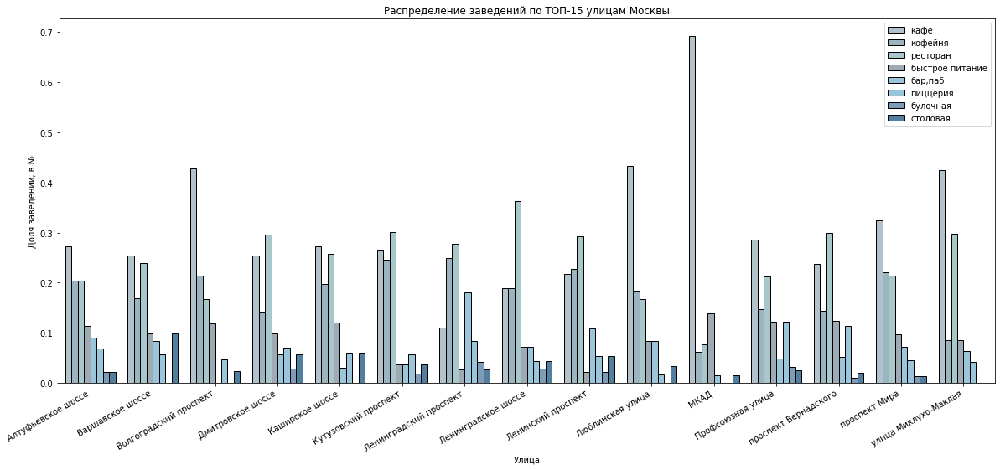

In [37]:
# сгруппируем данные по улицам, посчитаем количество, сделаем сортировку от большего значения к меньшему и выведем первые 15 значений,
# а также сохраним названия этих улиц в список
top_15_streets = df.groupby('street', as_index=False)['category'].count().sort_values(by='category', ascending=False)\
                 .head(15).reset_index(drop=True)
top_15_streets_names = top_15_streets['street'].unique()

# проведем дополнительную группировку по категориям, представленных на этих улицах при помощи предварительного среза
top_15_streets_stats = df.loc[df['street'].isin(top_15_streets_names)].groupby('street')['category']\
                       .value_counts(normalize=True).to_frame().rename(columns=({'category': 'number'})).reset_index(level=['street', \
                       'category'])

# построим соответствующую визуализацию 
plt.figure(figsize=(20, 8))
sns.barplot(data=top_15_streets_stats, x='street', y='number', hue='category', edgecolor='#000000')
plt.title('Распределение заведений по ТОП-15 улицам Москвы')
plt.xlabel('Улица')
plt.ylabel('Доля заведений, в №')
plt.xticks(rotation=30, ha='right')
plt.legend(loc='upper right')

plt.show()

На графике видно, что доминирующими типами заведений являются кафе, рестораны, кофейни, в меньшей степени представлены столовые, булочные и пиццерии. При этом на распределение влияют и географическое положение мест: например, в центральных частях города, например, на Кутузовском и Лениградском проспектах, доминируют рестораны, а на более отдаленных, например, Алтуфьевском шоссе и Волгоградском проспекте - кафе. При этом достаточно сильно выбивается МКАД, где виден самый большой перекос в сторону кафе. По открытым источникам МКАД является не просто дорогой, а улицей, поэтому удалять из таблицы и графика не будем. Также рассмотрим наименее популярные улицы: те, где количество заведений равно 1 - определим совокупное количество, а также посмотрим районы, где чаще всего встречаются такие улицы и какими категориями заведений они представлены.

In [38]:
# для начала проведем группировку и отфильтруем датасет по тем строкам, значение улицы в которых встречается один раз 
str_filter = df.groupby(['district', 'street', 'category'])['street'].count().to_frame().rename(columns=({'street': \
             'number'})).reset_index(level=['district', 'street', 'category']).query('number == 1')

# далее рассчитаем доли категорий заведений, представленных на каждой улице, но анализировать в дальнейшем улицы кажется бессмысленным
# поэтому изначально включили в группировку округа и категории
unp_streets = (((str_filter.groupby(['district', 'category'])['number'].sum()) / (str_filter['number'].sum())) * 100) \
              .to_frame().reset_index(level=['district', 'category'])

# посмотрим на общее количество строк в получившемся датасете
len(str_filter)

2325

Улиц, на которых присутствует одно заведение, оказалось 2325, что составляет в среднем 30% от всего датасета. Рассмотрим, в каких районах представлено большая часть данных улиц, а также доля заведений по категориям. В этот раз будем считать доли по отношению ко всей совокупности (улиц, где одно заведение), а не по конкретному административному округу, чтобы понять соотношение не внутри одного округа, а между ними.

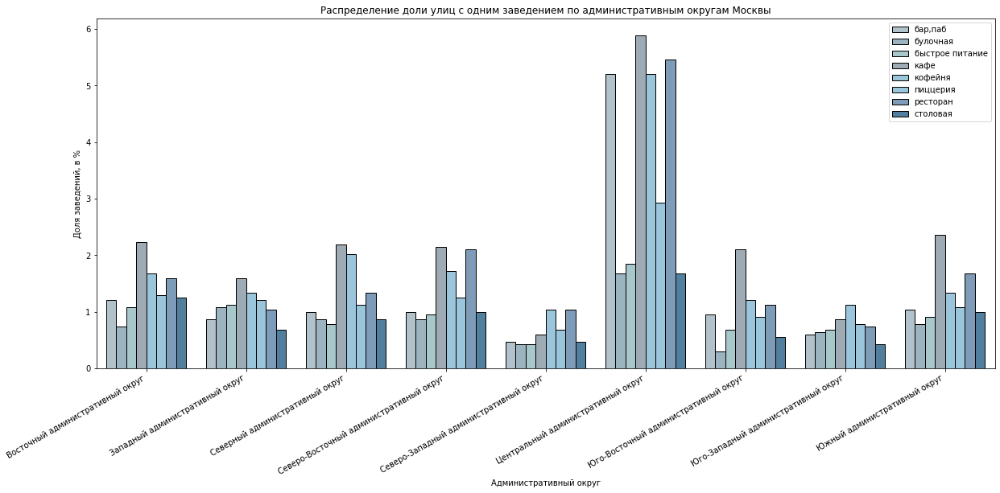

In [39]:
# построим соответствующую визуализацию 
plt.figure(figsize=(20, 8))
sns.barplot(data=unp_streets, x='district', y='number', hue='category', edgecolor='#000000')
plt.title('Распределение доли улиц с одним заведением по административным округам Москвы')
plt.xlabel('Административный округ')
plt.ylabel('Доля заведений, в %')
plt.xticks(rotation=30, ha='right')
plt.legend(loc='upper right')

plt.show()

На графике видно, что большинство улиц с одним заведенеим находятся в центральном административном округе: подобное вполне объясняется тем, что центр города в принципе является наиболее многочисленным местом по заведениям, поэтому и доля улиц с хотя бы одним заведением там оказывается больше. Более того, в центре присутствуют не только заведения, но и жилые дома, музеи, объекты культурного наследия и так далее, поэтому на некоторых улицах просто нет возможности размещать большее количество заведений в силу их размера (сравним, например, проспект с небольшой улицей в центре Москвы). В меньшей степени такие уоицы встреются в Северо-Западном и Юго-Западном административных округах, так как представлены жилыми комплексами и крупными шоссе.
По категориям заведений наблюдается большее количество кафе, ресторанов, баров и заведений быстрого питания, а в меньшем - столовых и пиццерий. 

#### Анализ среднего чека и уровня цен

Далее проведем анализ заведений по среднему чеку. Отметим, что колонка со средним чеком представлена неполными данными: в ней отсутствуют более 50% значений. В рамках этапа предобработки данных значение среднего чека никак не восстанавливлось во избежание смещения оценок. Таким образом, проводимый ниже анализ только частично отражает характеристики генеральной совокупности, в реальности же тенденция может быть немного иная. Для начала рассчитаем медианное значение среднего чека по категориям.

In [40]:
# группируем данные по категориям и рассчитываем медианные значения
avg_bill_by_cat = df.groupby('category', as_index=False)['middle_avg_bill'].median()
avg_bill_by_cat

,category,middle_avg_bill
0,"бар,паб",1250.0
1,булочная,435.0
2,быстрое питание,375.0
3,кафе,550.0
4,кофейня,400.0
5,пиццерия,600.0
6,ресторан,1250.0
7,столовая,300.0


Интересно то, что бары, булочные, быстрое питание, кафе и кофейни вообще не включают в себя показатели среднего чека. Проверим, действительно ли это так на примере кафе.

In [41]:
# сделаем срез данных по категории и рассчитаем количество значений в столбцах
df.query('category == "кафе"').count()

name                 2300
category             2300
address              2300
district             2300
hours                2300
lat                  2300
lng                  2300
rating               2300
price                2300
avg_bill              676
middle_avg_bill       672
middle_coffee_cup       4
chain                2300
seats                2300
street               2300
is_24/7              2300
dtype: int64

Видим, что значения в столбце со средним чеком все же имеются, но при этом медианный показатель почему-то оказался равен нулю. Рассчитаем показатели описательной статистики, чтобы получить более полную картинку по данному столбцу.

In [42]:
# рассчитываем показатели описательной статистики и транспонируем таблицу для более наглядного отображения данных
df.query('category == "кафе"').describe().T

,count,mean,std,min,25%,50%,75%,max
lat,2300.0,55.746013,0.074044,55.573942,55.687320,55.748212,55.796917,55.920386
lng,2300.0,37.616172,0.105444,37.355651,37.535832,37.613692,37.688092,37.862657
rating,2300.0,4.123391,0.567904,1.000000,4.000000,4.200000,4.400000,5.000000
middle_avg_bill,672.0,699.011905,497.519906,67.000000,350.000000,550.000000,1000.000000,4500.000000
middle_coffee_cup,4.0,105.500000,21.393145,75.000000,101.250000,111.000000,115.250000,125.000000
seats,2300.0,36.808696,56.240349,0.000000,0.000000,0.000000,50.500000,250.000000


Исходя из показателей в таблице можно сделать следующий вывод: так как в датасете представлено много пропусков, то медиана для обобщения данных в некоторых случаях не подходит, так как делит датасет на 2 части - 50% значений оказываются ниже этого показателя, а другие 50% - выше. Таким образом, если в столбце представлено более 50% пропусков, то медиана будет равно нулю, что не совсем верно с точки зрения проводимого анализа. Конечно, можно рассчитать среднее значение, однако оценки будут смещены, так как будут рассчитаны по отношению к тем заведениям, где представлены нулевые значения. Поэтому предлагается следующее: отфильтровать все данные в столбце среднего чека так, чтобы они представляли собой значение больше нуля, а уже потом работать с отфильтрованным датасетом.

In [43]:
# проводим фильтрацию при помощи среза и сохраняем обновленный датасет в новую переменную
df_filtered_by_avg_bill = df.query('middle_avg_bill > 0').copy().reset_index(drop=True)

# проведем аналогичную группировку с обновленными значениями
avg_filtered_bill_by_cat = df_filtered_by_avg_bill.groupby('category', as_index=False)['middle_avg_bill'].median()\
                           .sort_values(by='middle_avg_bill', ascending=False)
avg_filtered_bill_by_cat

,category,middle_avg_bill
0,"бар,паб",1250.0
6,ресторан,1250.0
5,пиццерия,600.0
3,кафе,550.0
1,булочная,435.0
4,кофейня,400.0
2,быстрое питание,375.0
7,столовая,300.0


Теперь значения выглядят более правдоподобными, так как не включают в себя те заведения, в которых отсутствуют данные по данному показателю. Визуализируем полученную таблицу.

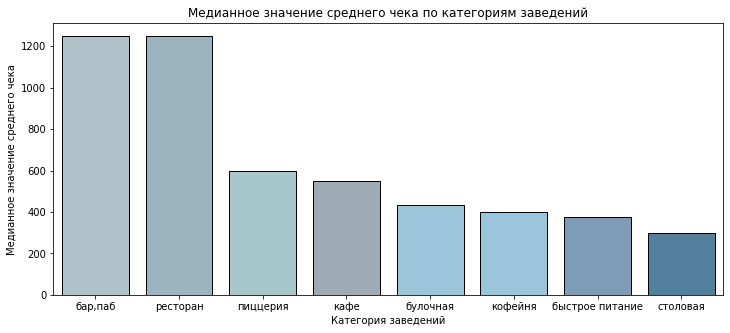

In [44]:
# построим график
plt.figure(figsize=(12, 5))
sns.barplot(data=avg_filtered_bill_by_cat, x='category', y='middle_avg_bill', edgecolor='#000000')
plt.title('Медианное значение среднего чека по категориям заведений')
plt.xlabel('Категория заведений')
plt.ylabel('Медианное значение среднего чека')

plt.show()

На графике видно, что самое высокое медианное значение среднего чека у баров и ресторанов - выше 1200 рублей, а самое низкое у столовых, кофеен, булочных и ресторанов быстрого питания - в районе 400 рублей, что, в целом, похоже на правду. Рассчитаем медианное значение по административным округам Москвы, за основу возьмем все тот же отфильтрованный датасет.

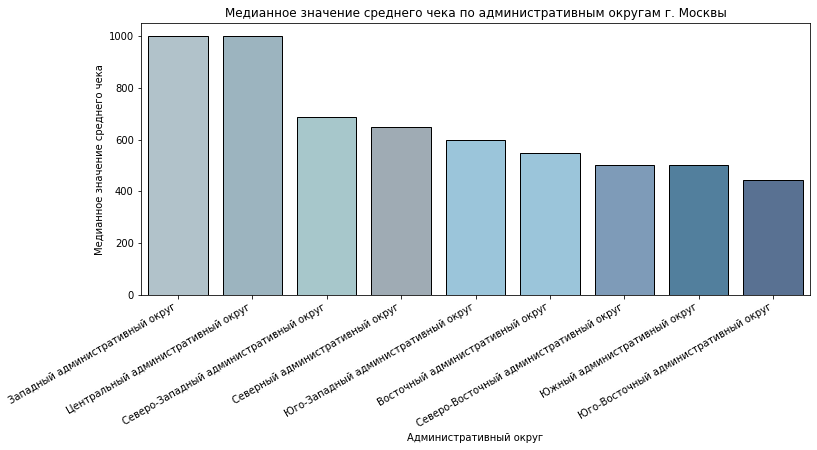

In [45]:
# проведем аналогичную группировку среднего чека по административным округам
avg_filtered_bill_by_dist = df_filtered_by_avg_bill.groupby('district', as_index=False)['middle_avg_bill'].median()\
                            .sort_values(by='middle_avg_bill', ascending=False)

# построим график
plt.figure(figsize=(12, 5))
sns.barplot(data=avg_filtered_bill_by_dist, x='district', y='middle_avg_bill', edgecolor='#000000')
plt.title('Медианное значение среднего чека по административным округам г. Москвы')
plt.xlabel('Административный округ')
plt.ylabel('Медианное значение среднего чека')
plt.xticks(rotation=30, ha='right')

plt.show()

На графике можно заметить, что самое высокое медианное значение среднего чека достигается в Западном и Центральном административных округах - около 1000 рублей, что отражает действительность, так как оба округа являются престижными для проживания, а также для посещения туристами. Остальные значение, в целом, схожи, однако снижаются от Северных округов до Южных - от 700 до 450 рублей. Для большей наглядности построим фоновую диаграмму.

In [46]:
# снова перезапишем переменную с картой Москвы, чтобы не наслаивать фоновую диаграмму на кластеры
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создадим фоновую диаграмму при помощи конструктура и отобразим ее
Choropleth(
    geo_data=msk_json,
    data=avg_filtered_bill_by_dist,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.5,
    legend_name='Медианное значение среднего чека по административным округам Москвы',
).add_to(m)
m

Снова видим отчетливую разницу в уровне цен между Западным и Центральным округами с остальными. Наконец, сделаем сводную диаграмму и по категории, и по административному округу.

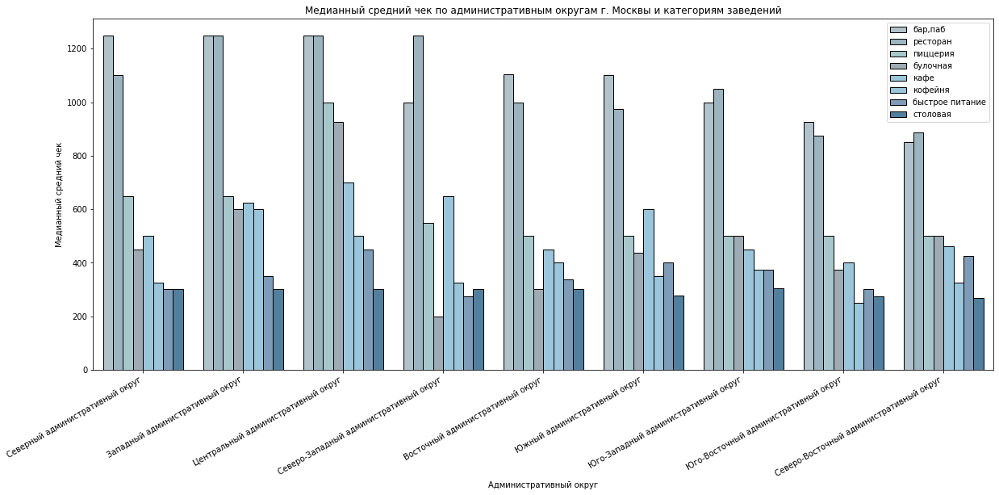

In [47]:
# проведем аналогичную группировку среднего чека по административным округам
avg_filtered_bill_by_dist = df_filtered_by_avg_bill.groupby(['category', 'district'])['middle_avg_bill'].median()\
                            .reset_index(level=['category', 'district']).sort_values(by='middle_avg_bill',\
                            ascending=False)

# построим график
plt.figure(figsize=(20, 8))
sns.barplot(data=avg_filtered_bill_by_dist, x='district', y='middle_avg_bill', hue='category', edgecolor='#000000')
plt.title('Медианный средний чек по административным округам г. Москвы и категориям заведений')
plt.xlabel('Административный округ')
plt.ylabel('Медианный средний чек')
plt.xticks(rotation=30, ha='right')
plt.legend(loc='upper right')

plt.show()

На графике видно, что наиболее крупными категориями заведений по медианному среднему чеку являются бары, рестораны, пиццерии, а также кофе, наименее - столовые, кофейни и булочные. Кроме того, на графике можно заметить то, что в некоторых административных округах значение среднего чека разнится достаточно сильно по категориям заведений, например, в Северном , Северо-Западном и так далее, а в других - менее, например, в Юго-Восточном и Северо-Восточном административных округах. Интересно также посмотреть на то, как меняется средний чек в зависимости от рейтинга заведения и есть ли между двумя показателями какая-либо зависимость.

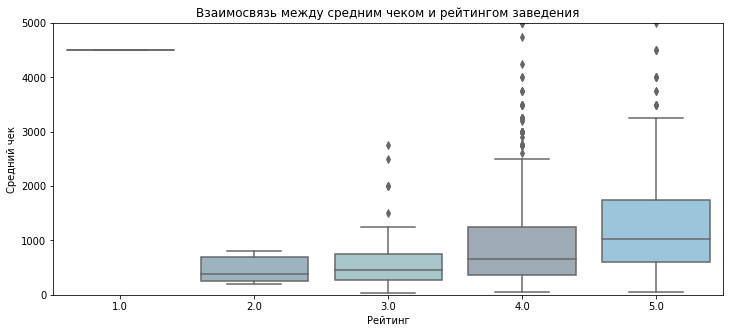

In [48]:
# округлим значения рейтинга в большую или меньшую сторону в зависимости от значения
df_filtered_by_avg_bill['rating'] = df_filtered_by_avg_bill['rating'].round()

# построим график boxplot для отображения взаимосвязи между категориальной и количественной переменными
plt.figure(figsize=(12, 5))
sns.boxplot(data=df_filtered_by_avg_bill, x='rating', y='middle_avg_bill')
plt.title('Взаимосвязь между средним чеком и рейтингом заведения')
plt.xlabel('Рейтинг')
plt.ylabel('Средний чек')
plt.ylim(0, 5000)

plt.show()

Так как среди среднего чека есть аномальные значения (около 30000), то величина оси y была ограничена: избавляться от этих значений мы не будем, так как в Москве есть достаточно дорогие рестораны и там действительно может быть такой средний чек. На графике видна следующая закономерность: в целом, с ростом рейтинга растет и величина среднего чека (как и медианное значение), а также появляется больше аномальных значений, что указывает на то, что чем выше рейтинг заведения, тем больше вероятность того, что оно будет дороже: например, у заведения с рейтингом 2 медианное значение по среднему чеку составляет менее 500 рублей, а у тех, что с рейтингом 5 - больше 1000, что в два раза больше. Интересным являются заведения с рейтингом 1: боксплот выглядит странно, как будто бы представлен одним заведением, проверим эту гипотезу.

In [49]:
# посмотрим на срез
df_filtered_by_avg_bill.query('rating <= 1')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
379,намангале,кафе,"Москва, проспект Мира, 119, стр. 503",Северо-Восточный административный округ,"ежедневно, 10:00–21:00",55.830405,37.617687,1.0,высокие,Средний счёт:4000–5000 ₽,4500.0,NaN,False,0,проспект Мира,False


Гипотеза подтвердилась: в датасете присутствует всего лишь одно заведение с рейтингом 1. В открытых источниках написано, что в данном заведении обманывают гостей в счете, поэтому не удивительно, что у него такая оценка. Кроме этого, стоит помнить, что при анализе рейтинга выяснили, что рейтинг большей части заведений в датасете больше 4 баллов, что также сказывается на полученных результатах. В завершении проанализируем взаимосвязь среднего чека и сетевыми/не сетевыми заведениями при помощи аналогичного графика.

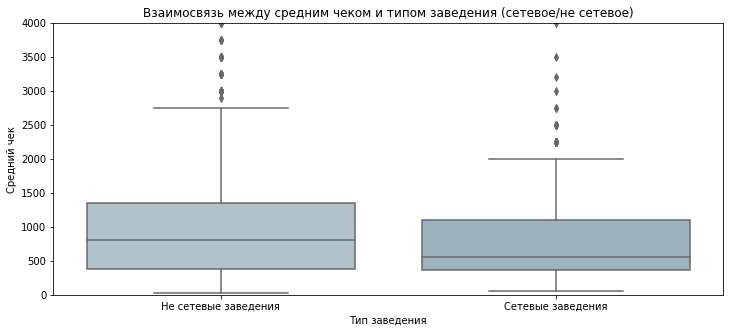

In [50]:
# построим график
plt.figure(figsize=(12, 5))
sns.boxplot(data=df_filtered_by_avg_bill, x='chain', y='middle_avg_bill').set_xticklabels\
           (['Не сетевые заведения', 'Сетевые заведения'])
plt.title('Взаимосвязь между средним чеком и типом заведения (сетевое/не сетевое)')
plt.xlabel('Тип заведения')
plt.ylabel('Средний чек')
plt.ylim(0, 4000)

plt.show()

Исходя из данных, представленных на графике, можно сделать выводы о том, что средний чек в не сетевых значениях оказывается больше, чем в сетевых, а также в большей степени варьируется в силу формы самого боксплота и наличия аномальных значений (на графике их не видно, так был ограничен масштаб по оси Y для более наглядного отображения взаимосвязи, но аномальные значения доходили там до 30000 и выше). В целом, подобные выводы похожи на правду: сетевые заведения берут количеством, поэтому и цены в них, как правило, ориентированы на массовое потребление, в то время как в не сетевых заведениях может наблюдаться противоположная картина в зависимости от целей заведения.

**Промежуточный вывод:**

- Наибольшее количество заведений общественного питания в Москве представляют собой кафе, на втором месте рестораны, а на третьем - кофейни. Меньше всего представлены заведения булочных и столовых.
- Большинство заведений обладают 50-150 местами, большим количеством - меньшая часть. При этом были обнаружены аномальные значения, составляющие менее 5% от всего датасета, поэтому были удалены во избежание искажения результатов анализа.
- Несетевые заведения превалируют над сетевыми, среди обеих категорий заведений лидируют быстрое питание, рестораны и кофейни, что уже было видно ранее при анализе долей среди категорий. При этом разница между сетевыми и несетевыми заведениями видна между соотношением баров и булочных: так, у не сетевых заведений доля баров значительно превышает булочные, а у сетей - практически одинаково. 
- Наиболее популярными и многочисленным сетевыми заведениями в Москве являются "Шоколадница", "Домино Пицца", "Додо Пицца", "One Price Coffee", "Яндекс Лавка" и "Cofix", а закрывают рейтинг "Чайхана", "Теремок", "Буханка", "Cofefest" и "Drivecafe". Наиболее популярными заведениями среди ТОП-15 являются кофейни, пиццерии и рестораны, при этом кофейни практически вдвое превышают пиццерии и рестораны, а также втрое и более кафе и булочные. При этом наименее частой категорией является булочная.
- Средний рейтинг среди категорий заведений находится в одном диапазоне - от 4 до 4.5 баллов. При этом категориями заведений с самым низким средним рейтингом, составляющим 4 балла, являются быстрое питание и кафе, а самыми высокими - бар, кофейня, пиццерия и ресторан. Заведений с рейтингом менее 4 не так много: всего лишь около 14% от всего датасета. Рейтинг меньше 4 баллов варьируется минимально и составляет около 3.4-3.5 баллов: самый высокий средний рейтинг в срезе у булочных и кофеен, а низкий - у баров.
- ТОП-15 улиц по количеству заведений в Москве составляют Алтуфьевское, Варшавское, Дмитровское, Каширское, Ленинградское шоссе, Волгоградский, Кутузовский, Ленинградский, Ленинский, Вернандского, проспект Мира, а также МКАД и улицы Любинская и Миклухо-Маклая. При этом на распределение влияют и географическое положение мест: например, в центральных частях города, например, на Кутузовском и Лениградском проспектах, доминируют рестораны, а на более отдаленных, например, Алтуфьевском шоссе и Волгоградском проспекте - кафе. Большинство улиц с одним заведенеим находятся в Центральном административном округе: подобное вполне объясняется тем, что центр города в принципе является наиболее многочисленным местом по заведениям, поэтому и доля улиц с хотя бы одним заведением там оказывается больше. 
- Самое высокое медианное значение среднего чека у баров и ресторанов - выше 1200 рублей, а самое низкое у столовых, кофеен, булочных и ресторанов быстрого питания - в районе 400 рублей. Если смотреть по административным округам, то самое высокое медианное значение среднего чека достигается в Западном и Центральном административных округах - около 1000 рублей, что отражает действительность, так как оба округа являются престижными для проживания, а также для посещения туристами. Остальные значение, в целом, схожи, однако снижаются от Северных округов до Южных - от 450 до 700 рублей. Кроме того, была обнаружена закономерность, что с ростом рейтинга растет и величина среднего чека, а средний чек в не сетевых заведениях оказывается больше, чем в сетевых.


### Анализ данных по кофейням

Проведем более детальной исследование по категории кофеен по запросу от фонда. Начнем с общего анализа кофеен, а также их расположения.

#### Анализ количества и расположения кофеен

In [51]:
# для удобства работы сделаем срез данных по категории и сохраним в соответствующую переменную
df_filtered_by_cof = df.query('category == "кофейня"').copy().reset_index(drop=True)

# рассчитаем количество заведений, а также долю от общего количества заведений
df_filtered_by_cof.shape[0], (df_filtered_by_cof.shape[0] / df.shape[0]) * 100

(1343, 16.781207047357242)

В датасете представлено 1343 заведения категории "кофейня", что составляет около 17% от общего количества заведений, то есть практически 1/5. Проанализируем географическое расположение по административным округам Москвы.

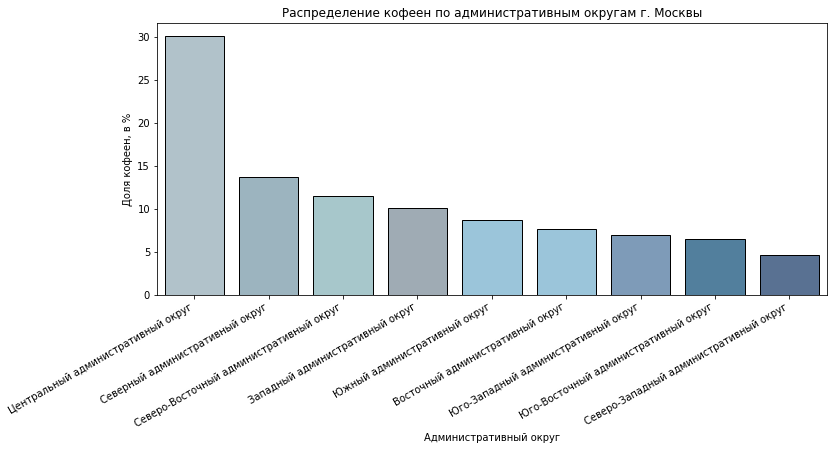

In [52]:
# сгруппируем значения по административным округам
df_filtered_by_cof_by_dist = ((df_filtered_by_cof.groupby('district')['category'].count() / len(df_filtered_by_cof)) \
                             * 100).reset_index(level='district').sort_values(by='category', ascending=False)

# построим график
plt.figure(figsize=(12, 5))
sns.barplot(data=df_filtered_by_cof_by_dist, x='district', y='category', edgecolor='#000000')
plt.title('Распределение кофеен по административным округам г. Москвы')
plt.xlabel('Административный округ')
plt.ylabel('Доля кофеен, в %')
plt.xticks(rotation=30, ha='right')

plt.show()

На графике видно, что практически 30% кофеен расположены в Центральном административном округе, 10-15% - в Северном, Северо-Восточном и Западном и менее 10% во всех остальных. В целом, это похоже на правду: кофейни действительно популярны в центре города и, например, в жилых районах с хорошей инфраструктурой. Для наглядности визуализируем кофейни в виде кластеров на карте Москвы, после чего проанализируем время работы кофеен.

In [53]:
# перезапишем переменную с картой Москвы, чтобы не наслаивать кластеры на фоновую диаграмму
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создадим новый кластер
marker_cluster = MarkerCluster().add_to(m)

# применим ранее созданную функцию к датасету и отобразим карту
df_filtered_by_cof.apply(create_clusters, axis=1)
m

#### Анализ времени работы кофеен

Время работы кофеен будем анализировать в разрезе того, круглосуточная она или нет. Для этого сгруппируем данные по времени работы и построим график.

In [54]:
# сгруппируем значения по времени работы, чтобы определить количество
df_filtered_by_cof_by_time_basic = df_filtered_by_cof.groupby('is_24/7')['category'].count().reset_index(level=\
                                   'is_24/7').sort_values(by='category', ascending=False)
df_filtered_by_cof_by_time_basic

,is_24/7,category
0,False,1285
1,True,58


В Москве всего 58 кофеен, которые работают круглосуточно.

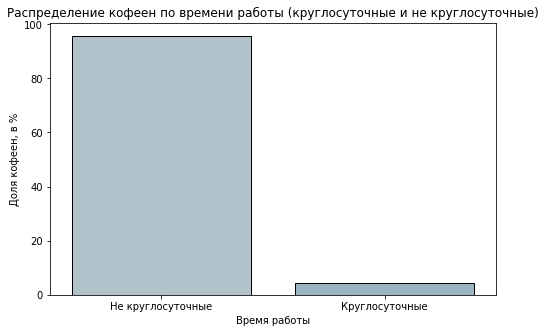

In [55]:
# сгруппируем значения по времени работы и выведем соотношение в процентах
df_filtered_by_cof_by_time = ((df_filtered_by_cof.groupby('is_24/7')['category'].count() / len(df_filtered_by_cof)) \
                             * 100).reset_index(level='is_24/7').sort_values(by='category', ascending=False)

# построим график
plt.figure(figsize=(8, 5))
sns.barplot(data=df_filtered_by_cof_by_time, x='is_24/7', y='category', edgecolor='#000000').set_xticklabels\
           (['Не круглосуточные', 'Круглосуточные'])
plt.title('Распределение кофеен по времени работы (круглосуточные и не круглосуточные)')
plt.xlabel('Время работы')
plt.ylabel('Доля кофеен, в %')

plt.show()

На графике видно, что больше 90% кофеен в Москве не работают круглосуточно, что важно учитывать в контексте проводимого исследования: вполне вероятно, что круглосуточные кофейни не пользуются спросом, но требуют гораздо больших затрат на содержание, что важно учитывать при формулировании финальных выводов. Далее проанализируем рейтинг кофеен.

#### Анализ рейтинга кофеен

Для начала проанализируем медианный рейтинг по категории кофеен в целом, а после рассмотрим как он распределяется по административным округам.

In [56]:
# в качестве показателя возьмем медианное значение (подошла бы и средняя, в данном датасете они схожи и практически не отличаются)
df_filtered_by_cof['rating'].median()

4.3

Медианный рейтинг кофеен равен 4.3, что, в целом, соответствует результатам, полученных нами в рамках основной части исследования: основная совокупность заведений в датасете представляет собой заведения с рейтингом 4 и выше. Далее рассмотрим распределение медианного рейтинга по административным округам и построим график.

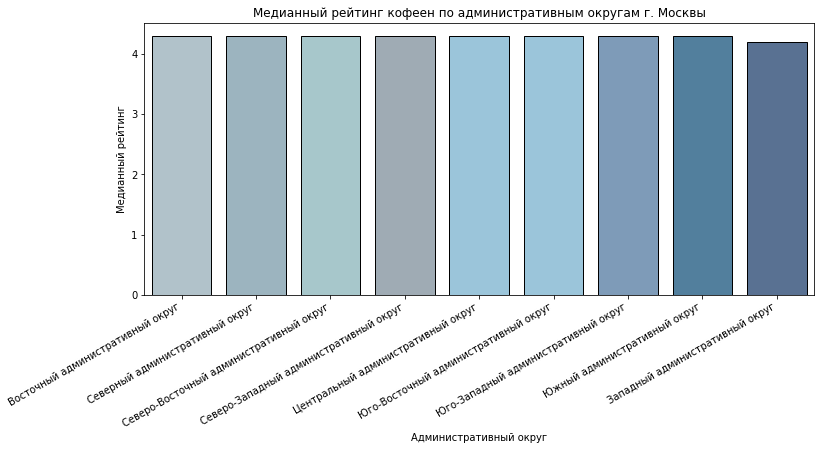

In [57]:
# сгруппируем данные по административным округам
df_filtered_by_cof_by_dist = df_filtered_by_cof.groupby('district', as_index=False)['rating'].median().sort_values\
                             (by='rating', ascending=False)

# построим график
plt.figure(figsize=(12, 5))
sns.barplot(data=df_filtered_by_cof_by_dist, x='district', y='rating', edgecolor='#000000')
plt.title('Медианный рейтинг кофеен по административным округам г. Москвы')
plt.xlabel('Административный округ')
plt.ylabel('Медианный рейтинг')
plt.xticks(rotation=30, ha='right')

plt.show()

На графике видно, что медианный рейтинг кофеен практически идентичен во всех административных округах, поэтому строить фоновую диаграмму для дополнительной визуализации будет избыточно. Гораздо более интересно посмотреть на долю кофеен с рейтингом менее 4, а также их распределение по округам.

In [58]:
# сгруппируем данные, сделав предварительный срез
df_filtered_by_cof_by_dist_bad_rating = df_filtered_by_cof.query('rating < 4').groupby('district', as_index=False)\
                                        ['rating'].median().sort_values(by='rating', ascending=False)

# узнаем количество для оценки значимости выводов
df_filtered_by_cof_by_dist.shape[0], (df_filtered_by_cof_by_dist.shape[0] / df_filtered_by_cof.shape[0]) * 100

(9, 0.6701414743112435)

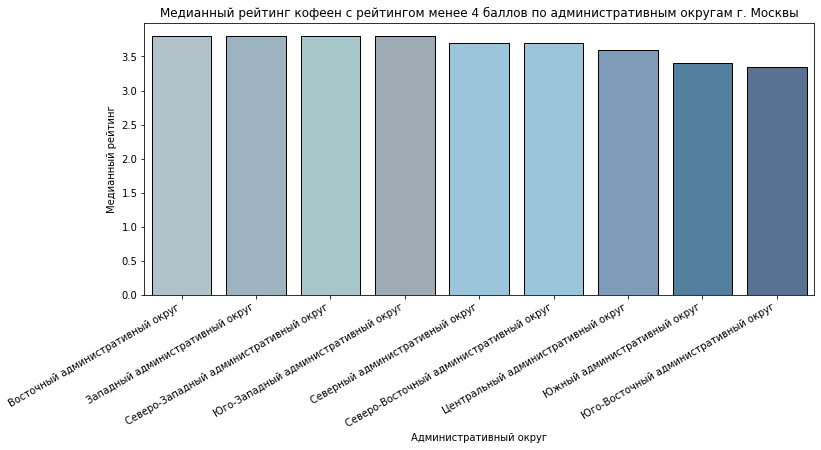

In [59]:
# построим график
plt.figure(figsize=(12, 5))
sns.barplot(data=df_filtered_by_cof_by_dist_bad_rating, x='district', y='rating', edgecolor='#000000')
plt.title('Медианный рейтинг кофеен с рейтингом менее 4 баллов по административным округам г. Москвы')
plt.xlabel('Административный округ')
plt.ylabel('Медианный рейтинг')
plt.xticks(rotation=30, ha='right')

plt.show()

В целом, динамика также отсутсвует: все заведения, с рейтингом менее 4 баллов, обладают медианным значением в районе 3 баллов. Более того, таких заведений в датасете всего лишь 9 единиц, что составляет менее 1% от всех кофеен, что не является значимым для формулирования выводов. Таким образом, можно сказать, что медианный рейтинг кофеен составляет, в целом, 4-4.5 баллов, при этом значение медианного рейтинга по по округам практически одинаковое. Далее проанализируем среднюю стоимость чашки капучино в кофейнях.

#### Анализ средней стоимости чашки капучино в кофейнях

Так как мы снова сталкиваемся с проблемой неполных данных, пропуски которых не были заполнены, то сделаем срез по тем кофейням, данные по стоимости чашки капучино которых присутствуют в датасете.

In [60]:
# делаем срез по тем кофейням, стоимость чашки капучино которых больше нуля
df_filtered_by_cof_by_avg_bill = df_filtered_by_cof.query('middle_coffee_cup > 0').copy().reset_index(drop=True)
df_filtered_by_cof_by_avg_bill.shape[0], (df_filtered_by_cof_by_avg_bill.shape[0] / len(df_filtered_by_cof)) * 100

(497, 37.00670141474311)

В среде присутствуют всего 497 кофеен, что составляет около 37% от всего датасета по кофейням в целом. Таким образом, выводы, которые будут сформулированы в данном разделе, могут несколько отличаться от полной картины в силу неполного характера данных. Проанализируем медианную стоимость чашки капучино в целом, а также по административным округам.

In [61]:
# рассчитаем медианную стоимость чашки капучино
df_filtered_by_cof_by_avg_bill['middle_coffee_cup'].median()

170.0

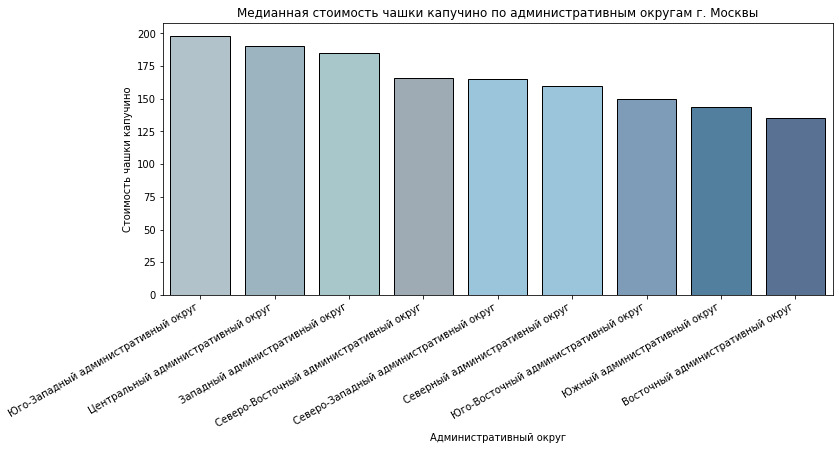

In [62]:
# сгруппируем данные по административным округам
df_filtered_by_cof_by_avg_bill_by_dist = df_filtered_by_cof_by_avg_bill.groupby('district', as_index=False)\
                                         ['middle_coffee_cup'].median().sort_values(by='middle_coffee_cup', \
                                         ascending=False)

# построим график
plt.figure(figsize=(12, 5))
sns.barplot(data=df_filtered_by_cof_by_avg_bill_by_dist, x='district', y='middle_coffee_cup', edgecolor='#000000')
plt.title('Медианная стоимость чашки капучино по административным округам г. Москвы')
plt.xlabel('Административный округ')
plt.ylabel('Стоимость чашки капучино')
plt.xticks(rotation=30, ha='right')

plt.show()

Медианная стоимость чашки капучино в целом составляет 170 рублей, но также варьируется по админастративным округам в отличие от рейтинга: например6 в Юго-Западном, Центральном и Западном административном округах чашка капучино стоит в районе 180-190 рублей, что составляет наибольшие значения, а в Юго-Восточном, Южном и Восточном округах - 130-150 рублей, что представляет собой наименьшие значения. Построим фоновую диаграмму для большей наглядности.

In [63]:
# снова перезапишем переменную с картой Москвы, чтобы не наслаивать фоновую диаграмму на кластеры
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создадим фоновую диаграмму при помощи конструктура и отобразим ее
Choropleth(
    geo_data=msk_json,
    data=df_filtered_by_cof_by_avg_bill_by_dist,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.5,
    legend_name='Медианная стоимость чашки капучино по административным округам г. Москвы',
).add_to(m)
m

Таким образом, тенденция становится более наглядной: стоимость чашки капучино оказывается больше в Центральном и западных округах, немного меньше в северных и составляет наименьшее значение в южных. Рассмотрим также влияние рейтинга на стоимость чашки капучино.

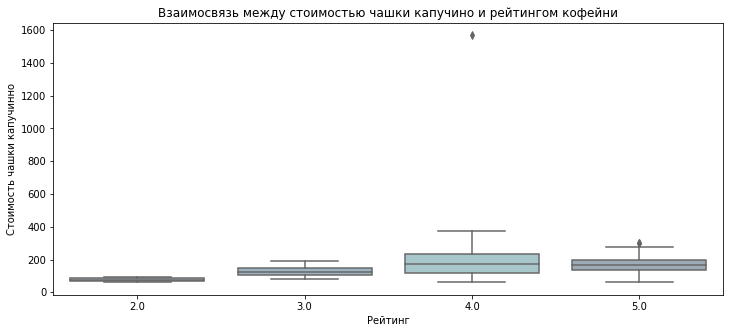

In [64]:
# также округлим значения рейтинга
df_filtered_by_cof_by_avg_bill['rating'] = df_filtered_by_cof_by_avg_bill['rating'].round()

# построим график boxplot для отображения взаимосвязи между категориальной и количественной переменными
plt.figure(figsize=(12, 5))
sns.boxplot(data=df_filtered_by_cof_by_avg_bill, x='rating', y='middle_coffee_cup')
plt.title('Взаимосвязь между стоимостью чашки капучино и рейтингом кофейни')
plt.xlabel('Рейтинг')
plt.ylabel('Стоимость чашки капучинно')

plt.show()

Видим, что у группы кофеен с рейтингом 4 присутсвует аномальное значение в 1600 рублей за чашку капучино. Перед проведением дальнейшего анализа посмотрим более внимательно на эту кофейню.

In [65]:
# делаем срез по стоимости
df_filtered_by_cof_by_avg_bill.query('middle_coffee_cup > 1000')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
194,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.0,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,True,48,Большая Семёновская улица,False


Странное значение: обычно кофе в "Шоколаднице" не стоит так дорого, тем более, что выброс представлен только одной кофейней, а не всей сетью в целом. Посмотрим на стоимость капучино в других заведениях сети.

In [66]:
# делаем срез по названию заведения
df_filtered_by_cof_by_avg_bill.query('name == "шоколадница"').head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
7,шоколадница,кофейня,"Москва, Дмитровское шоссе, 163Ак1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.910447,37.542227,4.0,неизвестно,Цена чашки капучино:239–274 ₽,NaN,256.0,True,0,Дмитровское шоссе,False
9,шоколадница,кофейня,"Москва, Широкая улица, 13А",Северо-Восточный административный округ,"ежедневно, 10:00–21:00",55.887990,37.662485,4.0,неизвестно,Цена чашки капучино:239–274 ₽,NaN,256.0,True,75,Широкая улица,False
12,шоколадница,кофейня,"Москва, Фестивальная улица, 13, корп. 1",Северный административный округ,"ежедневно, 08:00–23:00",55.855703,37.477670,4.0,неизвестно,Цена чашки капучино:239–274 ₽,NaN,256.0,True,100,Фестивальная улица,False
15,шоколадница,кофейня,"Москва, Сходненская улица, 25",Северо-Западный административный округ,"ежедневно, 08:00–23:00",55.846066,37.438897,4.0,средние,Цена чашки капучино:239–274 ₽,NaN,256.0,True,130,Сходненская улица,False
19,шоколадница,кофейня,"Москва, улица Адмирала Макарова, 6, стр. 13",Северный административный округ,"пн-чт 08:00–22:00; пт 08:00–23:00; сб,вс 09:00...",55.835660,37.490497,4.0,средние,Цена чашки капучино:239–274 ₽,NaN,256.0,True,80,улица Адмирала Макарова,False


Цена варьируется, но не так сильно. Вполне вероятно, что в данных есть ошибка - например, вместо стоимости кофе были указаны данные по среднему чеку или, например, не верно переданы данные. Также это может быть и не ошибка: сейчас в крупных городах популярны огромные кружки кофе, возможно, "Шоколадница" решила попробовать интегрировать этот тренд в одно из своих заведений сети. Тем не менее, узнать истинную причину выброса невозможно, а избавляться от него нет смысла, так как были использованы медианные, а не средние значения стоимости кружки капучино, которые являются устойчивыми к выбросам, тем более одиночным. Подкорректируем график, ограничив масштаб по оси Y. 

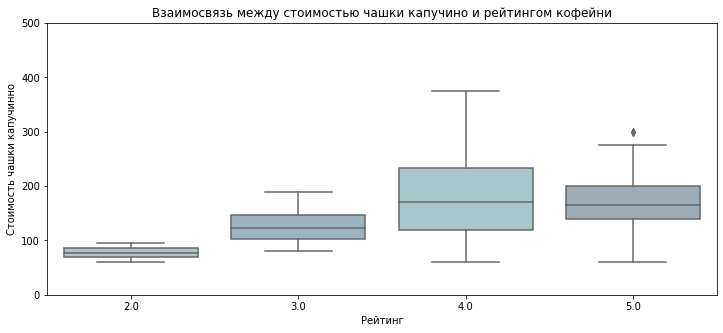

In [67]:
# корректируем график при помощи параметра plt.ylim()
plt.figure(figsize=(12, 5))
sns.boxplot(data=df_filtered_by_cof_by_avg_bill, x='rating', y='middle_coffee_cup')
plt.title('Взаимосвязь между стоимостью чашки капучино и рейтингом кофейни')
plt.xlabel('Рейтинг')
plt.ylabel('Стоимость чашки капучинно')
plt.ylim(0, 500)

plt.show()

На графике можно заметить, что по мере увеличения рейтинга увеличивается и стоимость чашки капучино, однако стоит помнить о том, что большая часть заведений в датасете представлены с рейтингом 4 балла и более, что оказывает влияние на полученные результаты. Так, заведения с рейтингом 2 обладают медианной стоимостью кружки капучино в районе 80-90 рублей, 3 - 120-140 рублей, 4 и 5 - 150-170 рублей, соответственно. Более того, самыми неоднородными с точки зрения рейтинга являются заведения с рейтингом 4 балла, а наиболее однородными - 2, однако стоит помнить о количестве кофеен в каждом сегменте: с рейтингом 4 балла их попросту больше, отсюда и такой разбег. Также проанализируем то, как варьируется стоимость капучино в зависимости от сетевого / не сетевого типа заведений.

In [68]:
# сгруппируем данные по типу заведений, чтобы проанализировать распределение в целом (в выборку снова попадают только те кофейне,
# у которых есть данные по стоимости чашки капучино)
df_filtered_by_cof_by_avg_bill.groupby('chain')['chain'].count()

chain
False    254
True     243
Name: chain, dtype: int64

Не сетевых кофеен оказывается больше. Сгруппируем общие данные по кофейням, чтобы понять, правда ли не сетевых кофеен в Москве больше, чем сетевых.

In [69]:
df_filtered_by_cof.groupby('chain')['chain'].count()

chain
False    667
True     676
Name: chain, dtype: int64

В целом, пропорции сохраняются, поэтому можно использовать данное соотношение в рамках проводимого анализа на выборке.

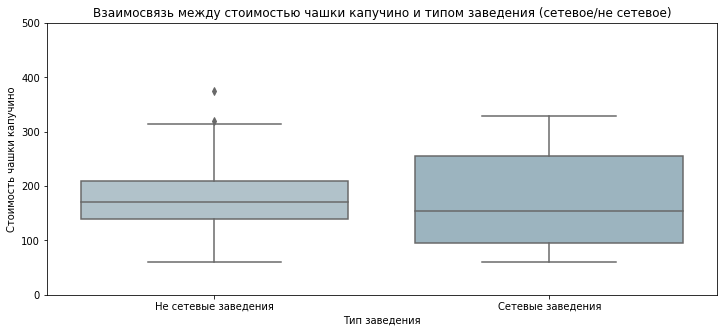

In [70]:
# построим график
plt.figure(figsize=(12, 5))
sns.boxplot(data=df_filtered_by_cof_by_avg_bill, x='chain', y='middle_coffee_cup').set_xticklabels\
           (['Не сетевые заведения', 'Сетевые заведения'])
plt.title('Взаимосвязь между стоимостью чашки капучино и типом заведения (сетевое/не сетевое)')
plt.xlabel('Тип заведения')
plt.ylabel('Стоимость чашки капучино')
plt.ylim(0, 500)

plt.show()

Медианная стоимость чашки капучино, в целом, схожа в обоих типах заведения: в сетевых она оказывается чуть ниже, но не намного, и составляет около 170 рублей, что уже выяснили ранее. Интересно распределение данных: в не сетевых заведениях стоимость варьируется меньше и в большей степени сосредоточена около медианного значения, в то время как в сетевых заведениях - значительнее. Подобное необходимо учитывать при формулировании выводов.

**Промежуточные выводы:**

- В датасете представлено 1343 заведения категории "кофейня", что составляет около 17% от общего количества заведений, то есть практически 1/5. Практически 30% кофеен расположены в Центральном административном округе, 10-15% - в Северном, Северо-Восточном и Западном и менее 10% во всех остальных. 
- Больше 90% кофеен в Москве не работают круглосуточно: вполне вероятно, что круглосуточные кофейни не пользуются спросом, но требуют гораздо больших затрат на содержание.
- Медианный рейтинг кофеен равен 4.3, что, в целом, соответствует результатам, полученных нами в рамках основной части исследования: основная совокупность заведений в датасете представляет собой заведения с рейтингом 4 и выше.  Все заведения, с рейтингом менее 4 баллов, обладают медианным значением в районе 3 баллов. Более того, таких заведений в датасете всего лишь 9 единиц, что составляет менее 1% от всех кофеен, что не является значимым для формулирования выводов. Таким образом, можно сказать, что медианный рейтинг кофеен составляет, в целом, 4-4.5 баллов, при этом значение медианного рейтинга по по округам практически одинаковое.
- Медианная стоимость чашки капучино в целом составляет 170 рублей, но также варьируется по админастративным округам в отличие от рейтинга: например, в Юго-Западном, Центральном и Западном административном округах чашка капучино стоит в районе 180-190 рублей, что составляет наибольшие значения, а в Юго-Восточном, Южном и Восточном округах - 130-150 рублей, что представляет собой наименьшие значения. Кроме того, рейтинг заведения также влияет на среднюю стоимость чашки капучино. Если же рассматривать не сетевые и сетевые заведения, то можно сказать, что медианная стоимость чашки капучино, в целом, схожа в обоих типах заведения: в сетевых она оказывается чуть ниже, но не намного, и составляет около 170 рублей. Интересно распределение данных: в не сетевых заведениях стоимость варьируется меньше и в большей степени сосредоточена около медианного значения, в то время как в сетевых заведениях - значительнее.

## Выводы и рекомендации

**В рамках проводимого анализа нами были получены следующие выводы:**
- Наибольшее количество заведений общественного питания в Москве представляют собой кафе, на втором месте рестораны, а на третьем - кофейни. Меньше всего представлены заведения булочных и столовых, а не сетевые заведения превалируют над сетевыми. Большинство заведений обладают 50-150 местами, большим количеством - меньшая часть.
- Наиболее популярными и многочисленным сетевыми заведениями в Москве являются "Шоколадница", "Домино Пицца", "Додо Пицца", "One Price Coffee", "Яндекс Лавка" и "Cofix", а закрывают рейтинг "Чайхана", "Теремок", "Буханка", "Cofefest" и "Drivecafe". Наиболее популярными заведениями среди ТОП-15 являются кофейни, пиццерии и рестораны, при этом кофейни практически вдвое превышают пиццерии и рестораны, а также втрое и более кафе и булочные. При этом наименее частой категорией является булочная. С точки зрения расположения заведений наиболее популярными являются следующие места: Алтуфьевское, Варшавское, Дмитровское, Каширское, Ленинградское шоссе, Волгоградский, Кутузовский, Ленинградский, Ленинский, Вернандского, проспект Мира, а также МКАД и улицы Любинская и Миклухо-Маклая, что влияет на категории заведений: на центральных улицах - рестораны и бары, а на более отдаленных - кафе. 
- Средний рейтинг варьируется от 4 баллов и выше, при этом заведений с более низким рейтингом мало, что составляет около 14% от всего датасета. 
- Самое высокое медианное значение среднего чека у баров и ресторанов - выше 1200 рублей, а самое низкое у столовых, кофеен, булочных и ресторанов быстрого питания - в районе 400 рублей. Если смотреть по административным округам, то самое высокое медианное значение среднего чека достигается в Западном и Центральном административных округах - около 1000 рублей, что отражает действительность, так как оба округа являются престижными для проживания, а также для посещения туристами. Остальные значение, в целом, схожи, однако снижаются от Северных округов до Южных - от 450 до 700 рублей.
- В датасете представлено 1343 заведения категории "кофейня", что составляет около 17% от общего количества заведений, то есть практически 1/5. Практически 30% кофеен расположены в Центральном административном округе, 10-15% - в Северном, Северо-Восточном и Западном и менее 10% во всех остальных, при этом менее 10% кофеен работает круглосуточно.
- Медианная стоимость чашки капучино в целом составляет 170 рублей, но также варьируется по админастративным округам в отличие от рейтинга: например, в Юго-Западном, Центральном и Западном административном округах чашка капучино стоит в районе 180-190 рублей, что составляет наибольшие значения, а в Юго-Восточном, Южном и Восточном округах - 130-150 рублей, что представляет собой наименьшие значения. Кроме того, рейтинг заведения также влияет на среднюю стоимость чашки капучино. Если же рассматривать не сетевые и сетевые заведения, то можно сказать, что медианная стоимость чашки капучино, в целом, схожа в обоих типах заведения: в сетевых она оказывается чуть ниже, но не намного, и составляет около 170 рублей. Интересно распределение данных: в не сетевых заведениях стоимость варьируется меньше и в большей степени сосредоточена около медианного значения, в то время как в сетевых заведениях - значительнее.

**После проведения анализа предлагаются следующие рекомендации:**
- Если рассматривать открытие любой категории заведения, то необходимо ориентироваться от бюджета: так, например, можно предположить, что стоимость открытия заведения в центральном районе значительно превышает стоимость открытия в более отдаленных местах, поэтому если фонд решится на открытие места в Центральном административном округе, то лучше ориентироваться на ресторан, кофейню или бар со средним чеком в районе 1000 рублей, а также на 50-100 посадочных мест. При этом важно учитывать, что проходимость в центре больше, поэтому рейтинг компания заработает быстрее, но и сервис нужен для этого соответствующий, чтобы выйти на 4 медианые балла (аудитория может быть разная: от обычных жителей до требовательных туристов). Если же бюджет позволяет открытие в более отдаленных районах, то в этом случае стоит ориентироваться на кафе или кофейню со средним чеком в районе 450-700 рублей и количеством мест 50-75 в силу не такой большой проходимости как в центре. Для выбора места открытия рекомендуется воспользоваться улицами из ТОП-15 по количеству: правда, стоит учитывать и конкуренцию на этих улицах, поэтому важно правильное позиционирование, УТП и так далее. Например, еще одна обычная кофейня в одном и том же здании вряд ли принесет большую выручку, а вот кофейня с уникальными блюдами и стилем - вполне.
- Если же рассматривать открытие кофейни, то можно придерживаться аналогичных рекомендаций, что и выше: при этом кофейню лучше размещать в Центральном административном округе в силу большей проходимости со стоимостью чашки капучино в районе 180-200 рублей, при этом если заведение планируется в центре, то лучше ориентироваться на сетевой формат для большей выручки и масштабируемости. Не сетевой формат может подойти в центре в случае сильной отстройки от конкурентов (например, кофейня в азиатском стиле или другие идеи), тогда можно варьировать стоимость напитков в меню, а также сделать интеграцию с другими категориями - например, кофейня, которая также функционирует, как и кафе. Если же выбирать более отдаленные районы, то нужно ориентироваться на стоимость чашки капучино в максимум 150 рублей, при этом если брать не сетевые заведения, то, скорее всего, относить их к какому-либо жилому комплексу, а сетевые с УТП на доступность и быстрое обслужиание.

**Ссылка на презентацию:** https://drive.google.com/file/d/1FnkrA1MA-Weyw3m-kUV0qYnahXOAofm-/view?usp=sharing